# 什么是目标检测

![任务描述](https://github.com/open-mmlab/mmyolo/assets/17425982/596d8061-0469-45fb-9739-4c0c8f2e0fef)


目标检测任务即：给定图片，网络预测出所关注的所有物体边界框和类别。其是一个典型的多任务学习，既包括物体边界框学习还包括类别学习。

MMDetection Repo：https://github.com/open-mmlab/mmdetection/

MMDetection 官方文档链接：https://mmdetection.readthedocs.io/en/latest/


下面我们将以 MMDetection 团队自研的 RTMDet 算法为例，结合一个简单的 cat 数据集来描述整个训练推理可视化过程。

本教程一共包括如下流程：

1. 数据集准备和可视化
2. 自定义配置文件
3. 训练前可视化验证
4. 模型训练
5. 模型测试和推理
6. 可视化分析

**注意事项：为了方便大家复现，本教程配套的 Notebook 将位于 https://github.com/open-mmlab/mmdetection/tree/tutorials 处。**

在开始前，需要先检测环境并安装 MMDetection 及其依赖

# 0 环境检测和安装

In [1]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Mon_May__3_19:15:13_PDT_2021
Cuda compilation tools, release 11.3, V11.3.109
Build cuda_11.3.r11.3/compiler.29920130_0
gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# 安装 mmengine 和 mmcv 依赖
# 为了防止后续版本变更导致的代码无法运行，我们暂时锁死版本
!pwd
%pip install -U "openmim==0.3.7"
!mim install "mmengine==0.7.1"
!mim install "mmcv==2.0.0"

# Install mmdetection
!rm -rf mmdetection
# 为了防止后续更新导致的可能无法运行，特意新建了 tutorials 分支
!git clone -b tutorials https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

%pip install -e .

/root/code
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Note: you may need to restart the kernel to use updated packages.
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.10.0/index.html
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.10.0/index.html
Cloning into 'mmdetection'...
remote: Enumerating objects: 36605, done.
remote: Counting objects: 100% (1259/1259), done.
remote: Compressing objects: 100% (685/685), done.
remote: Total 36605 (delta 701), reused 938 (delta 560), pack-reused 35346
Receiving objects: 100% (36605/36605), 56.85 MiB | 49.00 KiB/s, done.
Resolving deltas: 100% (25639/25639), done.
/root/code/mmdetection
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Obtaining file:///root/code/mmdetection
  Running setup.py develop for mmdet
Note: you may need to restart the kernel 

In [3]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet

# 环境信息收集和打印
def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

sys.platform: linux
Python: 3.8.10 (default, Jun  4 2021, 15:09:15) [GCC 7.5.0]
CUDA available: True
numpy_random_seed: 2147483648
GPU 0: NVIDIA GeForce RTX 3080
CUDA_HOME: /usr/local/cuda
NVCC: Cuda compilation tools, release 11.3, V11.3.109
GCC: gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
PyTorch: 1.10.0+cu113
PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055cf1bfa13efb658fe15dc9b41f0740)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,code=sm_80;-ge

# 1 数据集准备和可视化

In [6]:
# 数据集下载
import os

# os.chdir('mmdetection')
os.getcwd()

'/root/code/mmdetection'

In [ ]:
os.getcwd()

In [7]:
!wget https://download.openmmlab.com/mmyolo/data/balloon_dataset.zip

--2023-06-10 21:40:13--  https://download.openmmlab.com/mmyolo/data/balloon_dataset.zip
Resolving download.openmmlab.com (download.openmmlab.com)... 124.236.18.242, 124.236.18.243, 124.236.18.244
Connecting to download.openmmlab.com (download.openmmlab.com)|124.236.18.242|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 38741381 (37M) [application/zip]
Saving to: ‘balloon_dataset.zip’

balloon_dataset.zip 100%[===================>]  36.95M  16.4MB/s    in 2.3s    

2023-06-10 21:40:16 (16.4 MB/s) - ‘balloon_dataset.zip’ saved [38741381/38741381]



In [8]:
!unzip balloon_dataset.zip -d balloon_dataset && rm balloon_dataset.zip 
# 解压并删除压缩包

Archive:  balloon_dataset.zip
   creating: balloon_dataset/balloon/
   creating: balloon_dataset/balloon/train/
  inflating: balloon_dataset/balloon/train/via_region_data.json  
   creating: balloon_dataset/__MACOSX/
   creating: balloon_dataset/__MACOSX/balloon/
   creating: balloon_dataset/__MACOSX/balloon/train/
  inflating: balloon_dataset/__MACOSX/balloon/train/._via_region_data.json  
  inflating: balloon_dataset/balloon/train/53500107_d24b11b3c2_b.jpg  
  inflating: balloon_dataset/__MACOSX/balloon/train/._53500107_d24b11b3c2_b.jpg  
  inflating: balloon_dataset/balloon/train/120853323_d4788431b9_b.jpg  
  inflating: balloon_dataset/__MACOSX/balloon/train/._120853323_d4788431b9_b.jpg  
  inflating: balloon_dataset/balloon/train/126700562_8e27720147_b.jpg  
  inflating: balloon_dataset/__MACOSX/balloon/train/._126700562_8e27720147_b.jpg  
  inflating: balloon_dataset/balloon/train/145053828_e0e748717c_b.jpg  
  inflating: balloon_dataset/__MACOSX/balloon/train/._145053828_e0e7487

## 1.1json文件格式转换为coco格式-训练集

In [9]:
import os
os.chdir('../')
os.getcwd()

'/root/code'

In [11]:
import cv2
import json
import re
from collections import defaultdict

# 读取JSON文件
with open('mmdetection/balloon_dataset/balloon/train/via_region_data.json') as f:
    annotations = json.load(f)

# 初始化COCO格式字典
coco_dict = defaultdict(list)
coco_dict['info'] = {}
coco_dict['licenses'] = []
coco_dict['categories'] = []
coco_dict['images'] = []
coco_dict['annotations'] = []

# 添加info信息
coco_dict['info']['version'] = '1.0'
coco_dict['info']['description'] = 'Balloon Dataset'
coco_dict['info']['year'] = 2023
coco_dict['info']['contributor'] = 'YUJUNYU'
coco_dict['info']['date_created'] = '2023-06-09'

# 添加categories信息
category_id = 1
category = {'id': category_id, 'name': 'balloon', 'supercategory': 'object'}
coco_dict['categories'].append(category)

# 遍历每个图像的注释信息
annotation_id = 1
for image_id, image_info in annotations.items():
    # 从image_id中提取出正确的图像ID
    match = re.search(r'(\d+)_.*', image_id)
    if match:
        image_id = match.group(1)
    else:
        continue
    
    # 获取图像的文件名和大小
    filename = image_info['filename']
    size = image_info['size']
    # 获取图像的height和width
    img = cv2.imread(os.path.join('mmdetection/balloon_dataset/balloon/train/', filename))
    height, width, _ = img.shape
    # print(filename,height,width)
    
    # 添加图像信息
    image = {'id': int(image_id), 'file_name': filename, 'width': width, 'height': height}
    coco_dict['images'].append(image)
    
    # 获取多边形注释信息
    regions = image_info['regions']
    for region_id, region_info in regions.items():
        # 获取多边形顶点坐标
        x = region_info['shape_attributes']['all_points_x']
        y = region_info['shape_attributes']['all_points_y']
        points = list(zip(x, y))
        
        # 计算多边形的边界框
        xmin = min(x)
        xmax = max(x)
        ymin = min(y)
        ymax = max(y)
        width = xmax - xmin
        height = ymax - ymin
        
        # 添加注释信息
        annotation = {'id': annotation_id, 'image_id': int(image_id), 'category_id': category_id, 'segmentation': [points], 'area': width * height, 'bbox': [xmin, ymin, width, height], 'iscrowd': 0}
        coco_dict['annotations'].append(annotation)
        annotation_id += 1

# 保存COCO格式文件
with open('mmdetection/balloon_dataset/balloon/train/balloon_train.json', 'w') as f:
    json.dump(coco_dict, f)

print('success！')

success！


## 1.1测试集

In [12]:
import cv2
import json
import re
from collections import defaultdict
import cv2

# 读取JSON文件
with open('mmdetection/balloon_dataset/balloon/val/via_region_data.json') as f:
    annotations = json.load(f)

# 初始化COCO格式字典
coco_dict = defaultdict(list)
coco_dict['info'] = {}
coco_dict['licenses'] = []
coco_dict['categories'] = []
coco_dict['images'] = []
coco_dict['annotations'] = []

# 添加info信息
coco_dict['info']['version'] = '1.0'
coco_dict['info']['description'] = 'Balloon Dataset'
coco_dict['info']['year'] = 2023
coco_dict['info']['contributor'] = 'YUJUNYU'
coco_dict['info']['date_created'] = '2023-06-09'

# 添加categories信息
category_id = 1
category = {'id': category_id, 'name': 'balloon', 'supercategory': 'object'}
coco_dict['categories'].append(category)

# 遍历每个图像的注释信息
annotation_id = 1
for image_id, image_info in annotations.items():
    # 从image_id中提取出正确的图像ID
    match = re.search(r'(\d+)_.*', image_id)
    if match:
        image_id = match.group(1)
    else:
        continue
    
    # 获取图像的文件名和大小
    filename = image_info['filename']
    size = image_info['size']
    # 获取图像的height和width
    img = cv2.imread(os.path.join('mmdetection/balloon_dataset/balloon/val/', filename))
    height, width, _ = img.shape
    # print(filename,height,width)
    
    
    # 添加图像信息
    image = {'id': int(image_id), 'file_name': filename, 'width': width, 'height': height}
    coco_dict['images'].append(image)
    
    # 获取多边形注释信息
    regions = image_info['regions']
    for region_id, region_info in regions.items():
        # 获取多边形顶点坐标
        x = region_info['shape_attributes']['all_points_x']
        y = region_info['shape_attributes']['all_points_y']
        points = list(zip(x, y))
        
        # 计算多边形的边界框
        xmin = min(x)
        xmax = max(x)
        ymin = min(y)
        ymax = max(y)
        width = xmax - xmin
        height = ymax - ymin
        
        # 添加注释信息
        annotation = {'id': annotation_id, 'image_id': int(image_id), 'category_id': category_id, 'segmentation': [points], 'area': width * height, 'bbox': [xmin, ymin, width, height], 'iscrowd': 0}
        coco_dict['annotations'].append(annotation)
        annotation_id += 1

# 保存COCO格式文件
with open('mmdetection/balloon_dataset/balloon/val/balloon_val.json', 'w') as f:
    json.dump(coco_dict, f)

print('success！')

success！


## 1.2数据集可视化

In [15]:
import os

os.chdir('mmdetection')
os.getcwd()

'/root/code/mmdetection'

In [16]:
import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

img_path='balloon_dataset/balloon/train/'
image_paths= [filename for filename in os.listdir(img_path)][:8]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open(img_path+filename).convert("RGB")
  
    plt.subplot(2, 4, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

UnidentifiedImageError: cannot identify image file 'balloon_dataset/balloon/train/via_region_data.json'

<Figure size 1152x360 with 0 Axes>

COCO Json手动读取原始json

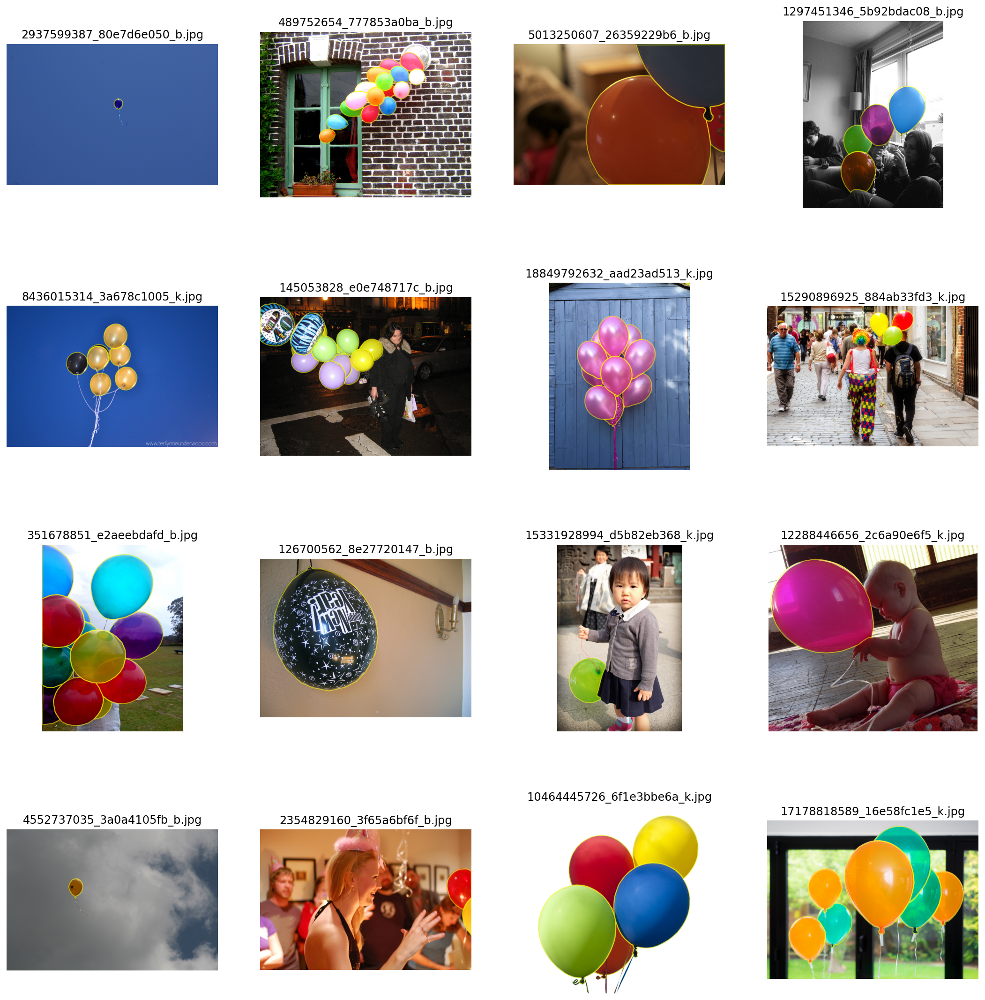

In [17]:
import json
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import random

# 读取JSON文件
with open('balloon_dataset/balloon/train/via_region_data.json') as f:
    annotations = json.load(f)

# 获取所有图像的ID
image_ids = list(annotations.keys())

# 随机选择16个图像ID
random_image_ids = random.sample(image_ids, 16)

# 创建一个4x4的子图
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# 遍历每个图像ID
for i, image_id in enumerate(random_image_ids):
    # 获取图像的文件名和大小
    filename = annotations[image_id]['filename']
    size = annotations[image_id]['size']
    
    # 读取图像文件
    image = Image.open(f'balloon_dataset/balloon/train/{filename}')
    
    # 获取多边形注释信息
    regions = annotations[image_id]['regions']
    patches = []
    for region_id, region_info in regions.items():
        # 获取多边形顶点坐标
        x = region_info['shape_attributes']['all_points_x']
        y = region_info['shape_attributes']['all_points_y']
        points = list(zip(x, y))
        
        # 创建多边形对象
        polygon = Polygon(points, True)
        patches.append(polygon)
    
    # 计算子图的行和列索引
    row = i // 4
    col = i % 4
    
    # 在子图中显示图像和注释
    axs[row, col].imshow(image)
    axs[row, col].set_title(filename)
    p = PatchCollection(patches, alpha=0.5, facecolor='none', edgecolor='yellow')
    axs[row, col].add_collection(p)

# 调整子图的间距和轴的可见性
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.4)
for ax in axs.flat:
    ax.axis('off')

# 显示子图
plt.show()

可视化标签（处理过的json-json2coco.ipynb）

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


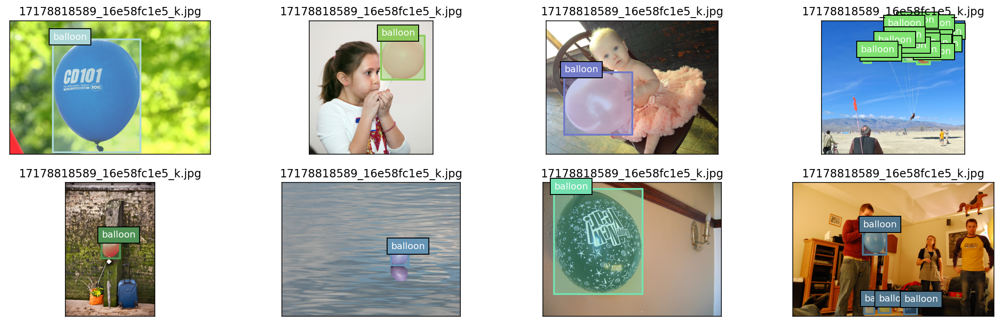

In [19]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image

    try:
        exif = image.getexif()
    except Exception:
        exif = None

    if exif is None:
        return image

    orientation = exif.get(_EXIF_ORIENT)

    method = {
        2: Image.FLIP_LEFT_RIGHT,
        3: Image.ROTATE_180,
        4: Image.FLIP_TOP_BOTTOM,
        5: Image.TRANSPOSE,
        6: Image.ROTATE_270,
        7: Image.TRANSVERSE,
        8: Image.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image


def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    """Show bounding box of annotations Only."""
    if len(anns) == 0:
        return

    ax = plt.gca()
    ax.set_autoscale_on(False)

    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]

    polygons = []
    colors = []

    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4, 2))))
        colors.append(color)

        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None

        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox)

    if is_filling:
        p = PatchCollection(
            polygons, facecolor=colors, linewidths=0, alpha=0.4)
        ax.add_collection(p)
    p = PatchCollection(
        polygons, facecolor='none', edgecolors=colors, linewidths=2)
    ax.add_collection(p)

    
coco = COCO('balloon_dataset/balloon/train/balloon_train.json')
image_ids = coco.getImgIds()
np.random.shuffle(image_ids)

plt.figure(figsize=(16, 5))

# 只可视化 8 张图片
for i in range(8):
    image_data = coco.loadImgs(image_ids[i])[0]
    image_path = osp.join('balloon_dataset/balloon/train',image_data['file_name'])
    annotation_ids = coco.getAnnIds(
            imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)
    
    ax = plt.subplot(2, 4, i+1)
    image = Image.open(image_path).convert("RGB")
    
    # 这行代码很关键，否则可能图片和标签对不上
    image=apply_exif_orientation(image)
    
    ax.imshow(image)
    
    show_bbox_only(coco, annotations)
    
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])
        
plt.tight_layout()    

# 2 自定义配置文件

本教程采用 RTMDet 进行演示，在开始自定义配置文件前，先来了解下 RTMDet 算法。

![RTMDet](https://user-images.githubusercontent.com/27466624/225922103-404064c1-3cb0-4ab5-9388-79f9517dcdb0.jpg)

其模型架构图如上所示。RTMDet 是一个高性能低延时的检测算法，目前已经实现了目标检测、实例分割和旋转框检测任务。其简要描述为：**为了获得更高效的模型架构，MMDetection 探索了一种具有骨干和 Neck 兼容容量的架构，由一个基本的构建块构成，其中包含大核深度卷积。MMDetection 进一步在动态标签分配中计算匹配成本时引入软标签，以提高准确性。结合更好的训练技巧，得到的目标检测器名为 RTMDet，在 NVIDIA 3090 GPU 上以超过 300 FPS 的速度实现了 52.8% 的 COCO AP，优于当前主流的工业检测器。RTMDet 在小/中/大/特大型模型尺寸中实现了最佳的参数-准确度权衡，适用于各种应用场景，并在实时实例分割和旋转对象检测方面取得了新的最先进性能。**


详情见 [论文](https://arxiv.org/abs/2212.07784)。



In [ ]:
# 当前路径位于 mmdetection/tutorials, 配置将写到 mmdetection/tutorials 路径下

config_cat = """
_base_ = 'configs/rtmdet/rtmdet_tiny_8xb32-300e_coco.py'

data_root = 'cat_dataset/'

# 非常重要
metainfo = {
    # 类别名，注意 classes 需要是一个 tuple，因此即使是单类，
    # 你应该写成 `cat,` 很多初学者经常会在这犯错
    'classes': ('cat',),
    'palette': [
        (220, 20, 60),
    ]
}
num_classes = 1

# 训练 40 epoch
max_epochs = 40
# 训练单卡 bs= 12
train_batch_size_per_gpu = 12
# 可以根据自己的电脑修改
train_num_workers = 4

# 验证集 batch size 为 1
val_batch_size_per_gpu = 1
val_num_workers = 2

# RTMDet 训练过程分成 2 个 stage，第二个 stage 会切换数据增强 pipeline
num_epochs_stage2 = 5

# batch 改变了，学习率也要跟着改变， 0.004 是 8卡x32 的学习率
base_lr = 12 * 0.004 / (32*8)

# 采用 COCO 预训练权重
load_from = 'https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'  # noqa

model = dict(
    # 考虑到数据集太小，且训练时间很短，我们把 backbone 完全固定
    # 用户自己的数据集可能需要解冻 backbone
    backbone=dict(frozen_stages=4),
    # 不要忘记修改 num_classes
    bbox_head=dict(dict(num_classes=num_classes)))

# 数据集不同，dataset 输入参数也不一样
train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    pin_memory=False,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        ann_file='annotations/trainval.json',
        data_prefix=dict(img='images/')))

val_dataloader = dict(
    batch_size=val_batch_size_per_gpu,
    num_workers=val_num_workers,
    dataset=dict(
        metainfo=metainfo,
        data_root=data_root,
        ann_file='annotations/test.json',
        data_prefix=dict(img='images/')))

test_dataloader = val_dataloader

# 默认的学习率调度器是 warmup 1000，但是 cat 数据集太小了，需要修改 为 30 iter
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=30),
    dict(
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,  # max_epoch 也改变了
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]
optim_wrapper = dict(optimizer=dict(lr=base_lr))

# 第二 stage 切换 pipeline 的 epoch 时刻也改变了
_base_.custom_hooks[1].switch_epoch = max_epochs - num_epochs_stage2

val_evaluator = dict(ann_file=data_root + 'annotations/test.json')
test_evaluator = val_evaluator

# 一些打印设置修改
default_hooks = dict(
    checkpoint=dict(interval=10, max_keep_ckpts=2, save_best='auto'),  # 同时保存最好性能权重
    logger=dict(type='LoggerHook', interval=5))
train_cfg = dict(max_epochs=max_epochs, val_interval=10)
"""

with open('rtmdet_tiny_1xb12-40e_cat.py', 'w') as f:
    f.write(config_cat)

需要注意几个问题：

1. 自定义数据集中最重要的是 metainfo 字段，用户在配置完成后要记得将其传给 dataset，否则不生效(有些用户在自定义数据集时候喜欢去 直接修改 coco.py 源码，这个是强烈不推荐的做法，正确做法是配置 metainfo 并传给 dataset)

2. 如果用户 metainfo 配置不正确，通常会出现几种情况：(1) 出现 num_classes 不匹配错误 (2) loss_bbox 始终为 0 (3) 出现训练后评估结果为空等典型情况

3. MMDetection 提供的学习率大部分都是基于 8 卡，如果你的总 bs 不同，一定要记得缩放学习率，否则有些算法很容易出现 NAN，具体参考 https://mmdetection.readthedocs.io/zh_CN/latest/user_guides/train.html#id3

# 3 训练前可视化验证

我们可以采用 mmdet 提供的 `tools/analysis_tools/browse_dataset.py` 脚本来对训练前的 dataloader 输出进行可视化，确保数据部分没有问题。
考虑到我们仅仅想可视化前几张图片，因此下面基于 browse_dataset.py 实现一个简单版本即可

In [23]:
import os

# os.chdir('mmdetection')
os.getcwd()

'/root/code/mmdetection'

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
06/10 21:46:45 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


/root/miniconda3/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:741: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:812: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
/root/code/mmdetection/mmdet/visualization/palette.py:90: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  scales = 0.5 + (areas - min_area) // (max_area - min_area)


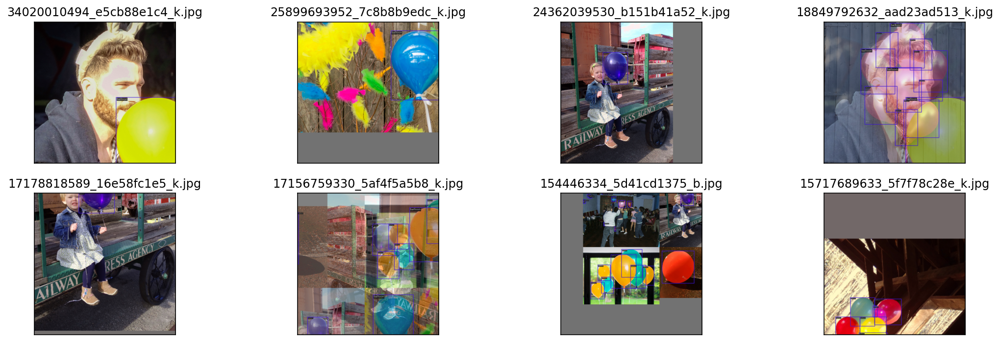

In [25]:
from mmdet.registry import DATASETS, VISUALIZERS
from mmengine.config import Config
from mmengine.registry import init_default_scope

cfg = Config.fromfile('balloon_dataset/balloon_rtmdet.py') #换成自己的

init_default_scope(cfg.get('default_scope', 'mmdet'))

dataset = DATASETS.build(cfg.train_dataloader.dataset)
visualizer = VISUALIZERS.build(cfg.visualizer)
visualizer.dataset_meta = dataset.metainfo

plt.figure(figsize=(16, 5))

# 只可视化前 8 张图片
for i in range(8):
   item=dataset[i]

   img = item['inputs'].permute(1, 2, 0).numpy()
   data_sample = item['data_samples'].numpy()
   gt_instances = data_sample.gt_instances
   img_path = osp.basename(item['data_samples'].img_path)

   gt_bboxes = gt_instances.get('bboxes', None)
   gt_instances.bboxes = gt_bboxes.tensor
   data_sample.gt_instances = gt_instances

   visualizer.add_datasample(
            osp.basename(img_path),
            img,
            data_sample,
            draw_pred=False,
            show=False)
   drawed_image=visualizer.get_image()

   plt.subplot(2, 4, i+1)
   plt.imshow(drawed_image[..., [2, 1, 0]])
   plt.title(f"{osp.basename(img_path)}")
   plt.xticks([])
   plt.yticks([])

plt.tight_layout()    

# 4 模型训练

在验证数据流本身没有问题后，就可以开始进行训练了

In [26]:
!python tools/train.py balloon_dataset/balloon_rtmdet.py

06/10 21:47:14 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.10 (default, Jun  4 2021, 15:09:15) [GCC 7.5.0]
    CUDA available: True
    numpy_random_seed: 962499431
    GPU 0: NVIDIA GeForce RTX 3080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.3, V11.3.109
    GCC: gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
    PyTorch: 1.10.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055cf1bfa13efb658fe15dc9b41f0740)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,co

由于 google colab 的 IO 读取 data_time 时间很长，训练大概需要 15 分钟。实际上在低端 1660 显卡的本地环境上运行大概只需要 5 分钟。

运行完成后，会在当前路径下生成 work_dirs/rtmdet_tiny_1xb12-40e_cat 路径，内部存放了 log 和权重文件。


# 5 模型测试和推理
如果你想离线测试，则可以使用我们提供的 test.py 脚本

In [ ]:
!python tools/test.py work_dirs/balloon_rtmdet/balloon_rtmdet.py code/mmdetection/work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth

05/17 12:09:15 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.11 (main, Apr  5 2023, 14:15:10) [GCC 9.4.0]
    CUDA available: True
    numpy_random_seed: 1351423385
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
    PyTorch: 2.0.0+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50

在测试阶段，你可以设置 --show-dir 将测试图片的真实值和预测值保存下来，然后进行深入分析。

In [29]:
!python tools/test.py work_dirs/balloon_rtmdet/balloon_rtmdet.py work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth --show-dir results

06/10 21:58:30 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.10 (default, Jun  4 2021, 15:09:15) [GCC 7.5.0]
    CUDA available: True
    numpy_random_seed: 1155622591
    GPU 0: NVIDIA GeForce RTX 3080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.3, V11.3.109
    GCC: gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
    PyTorch: 1.10.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055cf1bfa13efb658fe15dc9b41f0740)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,c

会在 `work_dir/rtmdet/当前时间戳/results/` 下生成测试图片，下面对前 8 张图片进行可视化

In [2]:
import os
os.chdir('mmdetection')
os.getcwd()

'/root/code/mmdetection'

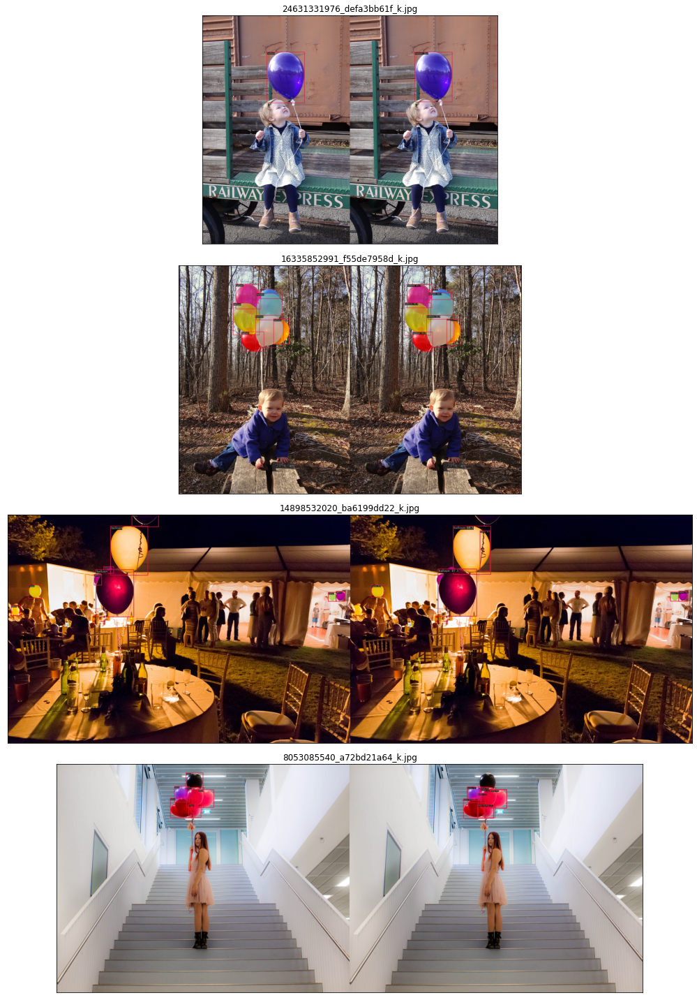

In [4]:
# 数据集可视化

import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

plt.figure(figsize=(20, 20))

# 你如果重新跑，这个时间戳是不一样的，需要自己修改
root_path='work_dirs/balloon_rtmdet/20230610_215829/results/'
image_paths= [filename for filename in os.listdir(root_path)][:4]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open(root_path+filename).convert("RGB")
  
    plt.subplot(4, 1, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

In [5]:
!wget http://digitalpaper.stdaily.com/http_www.kjrb.com/kjrb/images/2020-10/22/04/824719_lix_1603271812153_b.jpg -O balloon_dataset/balloon_test.png


--2023-06-10 22:02:18--  http://digitalpaper.stdaily.com/http_www.kjrb.com/kjrb/images/2020-10/22/04/824719_lix_1603271812153_b.jpg
Resolving digitalpaper.stdaily.com (digitalpaper.stdaily.com)... 58.220.73.254, 58.220.69.111
Connecting to digitalpaper.stdaily.com (digitalpaper.stdaily.com)|58.220.73.254|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64987 (63K) [image/jpeg]
Saving to: ‘balloon_dataset/balloon_test.png’

balloon_dataset/bal 100%[===================>]  63.46K  --.-KB/s    in 0.03s   

2023-06-10 22:02:18 (1.85 MB/s) - ‘balloon_dataset/balloon_test.png’ saved [64987/64987]



左边显示的是标注框，右边显示的是预测框。

实际上 MMDetection 支持多种可视化后端，例如 TensorBoard 和 WandB，默认情况下是将图片保存到本地，用户只需要修改可视化部分配置即可轻松切换。如下所示

以下配置只需要加到 `ballon_rtmdet.py` 配置最后即可

**(1) 同时使用本地和 WandB 后端**

```python
visualizer = dict(vis_backends = [dict(type='LocalVisBackend'), dict(type='WandbVisBackend')])
```

**(2) 仅仅使用 TensorBoard 后端**

```python
visualizer = dict(vis_backends = [dict(type='TensorboardVisBackend')])
```
修改配置后重新运行 test.py 即可在 WandB 和 TensorBoard 前端界面查看 图片和 log 等。

如果想对单张图片进行推理，你可以直接使用 `mmdetection/demo/image_demo.py` 脚本

In [6]:
!python demo/image_demo.py balloon_dataset/balloon_test.png balloon_dataset/balloon_rtmdet.py --weights work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth

Loads checkpoint by local backend from path: work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth
06/10 22:03:42 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
06/10 22:03:42 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:445: ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   
the indexing argument. (Triggered internally at  
../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/code/mmdetection/mmdet/visualization/palette.py:90: UserWarning: ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   
__floordiv__ is deprecated, and its behavior wi

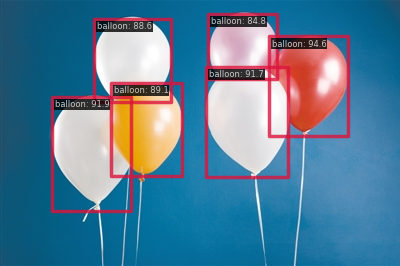

In [7]:
from PIL import Image
Image.open('outputs/vis/balloon_test.png')

# 6 可视化分析

可视化分析包括特征图可视化以及类似 Grad CAM 等可视化分析手段。不过由于 MMDetection 中还没有实现，我们可以直接采用 MMYOLO 中提供的功能和脚本。MMYOLO 是基于 MMDetection 开发，并且此案有了统一的代码组织形式，因此 MMDetection 配置可以直接在 MMYOLO 中使用，无需更改配置。

## MMYOLO 环境和依赖安装

In [1]:
import os
os.chdir('mmdetection')
os.getcwd()

'/root/code/mmdetection'

In [2]:
!pwd
%cd ../
!rm -rf mmyolo
# 为了防止后续更新导致的可能无法运行，特意新建了 tutorials 分支
!git clone -b tutorials https://github.com/open-mmlab/mmyolo.git 
%cd mmyolo


/root/code/mmdetection
/root/code
Cloning into 'mmyolo'...
remote: Enumerating objects: 4898, done.
remote: Counting objects: 100% (289/289), done.
remote: Compressing objects: 100% (172/172), done.
remote: Total 4898 (delta 122), reused 230 (delta 112), pack-reused 4609
Receiving objects: 100% (4898/4898), 3.75 MiB | 5.70 MiB/s, done.
Resolving deltas: 100% (3011/3011), done.
/root/code/mmyolo


In [3]:
%pip install -e .
# mim install mmyolo
!pwd

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Obtaining file:///root/code/mmyolo
  Running setup.py develop for mmyolo
Note: you may need to restart the kernel to use updated packages.
/root/code/mmyolo


## 特征图可视化

MMYOLO 中，将使用 MMEngine 提供的 `Visualizer` 可视化器进行特征图可视化，其具备如下功能：

- 支持基础绘图接口以及特征图可视化。
- 支持选择模型中的不同层来得到特征图，包含 `squeeze_mean` ， `select_max` ， `topk` 三种显示方式，用户还可以使用 `arrangement` 自定义特征图显示的布局方式。

你可以调用 `demo/featmap_vis_demo.py` 来简单快捷地得到可视化结果，为了方便理解，将其主要参数的功能梳理如下：

- `img`：选择要用于特征图可视化的图片，支持单张图片或者图片路径列表。

- `config`：选择算法的配置文件。

- `checkpoint`：选择对应算法的权重文件。

- `--out-file`：将得到的特征图保存到本地，并指定路径和文件名。

- `--device`：指定用于推理图片的硬件，`--device cuda：0`  表示使用第 1 张 GPU 推理，`--device cpu` 表示用 CPU 推理。

- `--score-thr`：设置检测框的置信度阈值，只有置信度高于这个值的框才会显示。

- `--preview-model`：可以预览模型，方便用户理解模型的特征层结构。

- `--target-layers`：对指定层获取可视化的特征图。

  - 可以单独输出某个层的特征图，例如： `--target-layers backbone` ,  `--target-layers neck` ,  `--target-layers backbone.stage4` 等。
  - 参数为列表时，也可以同时输出多个层的特征图，例如： `--target-layers backbone.stage4 neck` 表示同时输出 backbone 的 stage4 层和 neck 的三层一共四层特征图。

- `--channel-reduction`：输入的 Tensor 一般是包括多个通道的，`channel_reduction` 参数可以将多个通道压缩为单通道，然后和图片进行叠加显示，有以下三个参数可以设置：

  - `squeeze_mean`：将输入的 C 维度采用 mean 函数压缩为一个通道，输出维度变成 (1, H, W)。
  - `select_max`：将输入先在空间维度 sum，维度变成 (C, )，然后选择值最大的通道。
  - `None`：表示不需要压缩，此时可以通过 `topk` 参数可选择激活度最高的 `topk` 个特征图显示。

- `--topk`：只有在 `channel_reduction` 参数为 `None` 的情况下， `topk` 参数才会生效，其会按照激活度排序选择 `topk` 个通道，然后和图片进行叠加显示，并且此时会通过 `--arrangement` 参数指定显示的布局，该参数表示为一个数组，两个数字需要以空格分开，例如： `--topk 5 --arrangement 2 3` 表示以 `2行 3列` 显示激活度排序最高的 5 张特征图， `--topk 7 --arrangement 3 3` 表示以 `3行 3列` 显示激活度排序最高的 7 张特征图。

  - 如果 topk 不是 -1，则会按照激活度排序选择 topk 个通道显示。
  - 如果 topk = -1，此时通道 C 必须是 1 或者 3 表示输入数据是图片，否则报错提示用户应该设置 `channel_reduction` 来压缩通道。

- 考虑到输入的特征图通常非常小，函数默认将特征图进行上采样后方便进行可视化。

**注意：当图片和特征图尺度不一样时候，`draw_featmap` 函数会自动进行上采样对齐。如果你的图片在推理过程中前处理存在类似 Pad 的操作此时得到的特征图也是 Pad 过的，那么直接上采样就可能会出现不对齐问题。**


In [3]:
import os
os.chdir('mmdetection')
os.getcwd()

'/root/code/mmdetection'

不过由于这张图片分辨率过大，会导致程序奔溃，因此我们先将其缩放处理

In [5]:
import cv2

img = cv2.imread('balloon_dataset/balloon_test.png')

print(img.shape)

# h,w=img.shape[:2]
# resized_img = cv2.resize(img, (640, 640))
# cv2.imwrite('mmdetection/balloon_dataset/balloon_resize.jpg', resized_img)

(266, 400, 3)


False

In [6]:
import os
os.chdir('mmyolo')
os.getcwd()

'/root/code/mmyolo'

**1. 可视化 backbone 输出的 3 个通道**

In [7]:
!python demo/featmap_vis_demo.py \
      ../mmdetection/balloon_dataset/balloon_test.png \
      ../mmdetection/balloon_dataset/balloon_rtmdet.py \
      ../mmdetection/work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth \
      --target-layers backbone  \
      --channel-reduction squeeze_mean

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth
06/11 09:24:25 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/code/mmdetection/mmdet/visualization/palette.py:90: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor divis

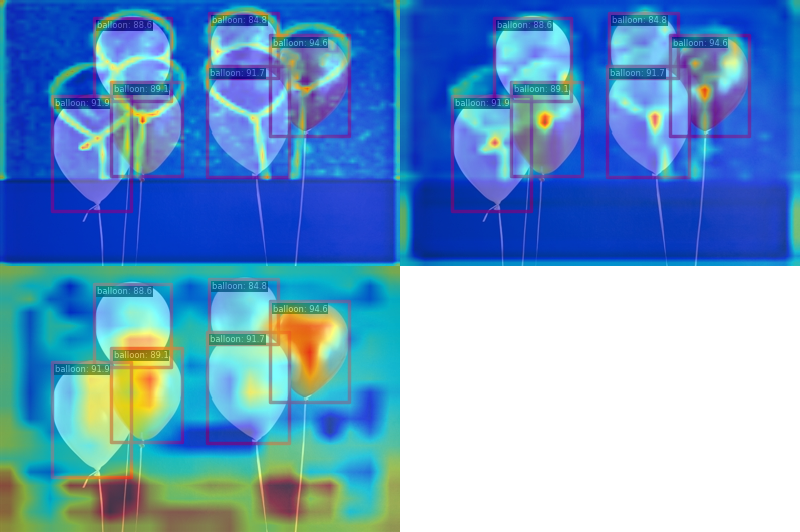

In [8]:
from PIL import Image
Image.open('output/balloon_test.png')    

**2. 可视化 neck 输出的 3 个通道**

In [11]:
!python demo/featmap_vis_demo.py \
      ../mmdetection/balloon_dataset/balloon_test.png \
      ../mmdetection/balloon_dataset/balloon_rtmdet.py \
      ../mmdetection/work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth  \
      --target-layers neck  \
      --channel-reduction squeeze_mean

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth
06/11 09:25:29 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/code/mmdetection/mmdet/visualization/palette.py:90: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor divis

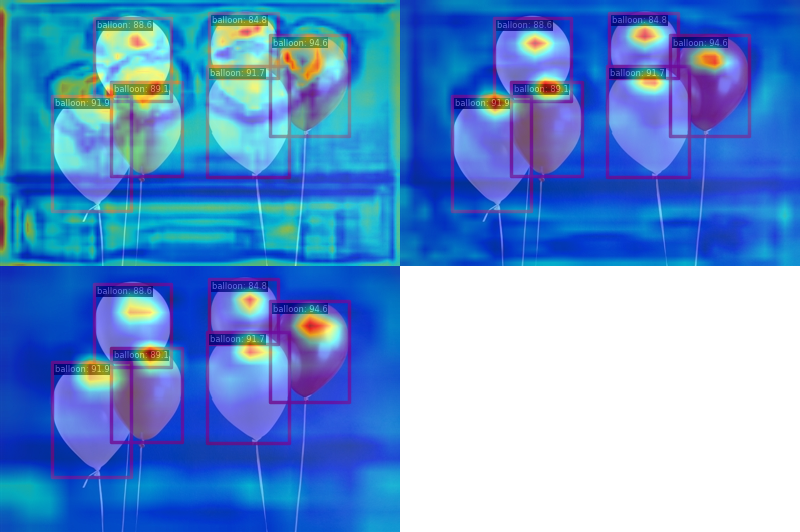

In [12]:
Image.open('output/balloon_test.png')     

## Grad-Based CAM 可视化

由于目标检测的特殊性，这里实际上可视化的并不是 CAM 而是 Grad Box AM。使用前需要先安装 grad-cam 库


In [13]:
!pip install "grad-cam"

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     |████████████████████████████████| 7.8 MB 14.7 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.6-py3-none-any.whl size=38241 sha256=8ddb1cec281d932a74c99a1953e99322aa0b236997ee06fccbc73b688626b570
  Stored in directory: /root/.cache/pip/wheels/6c/16/cb/1f4064fc8846c1cd9d029e2561bd809dab8eb6da34f51a1d03
Successfully built grad-cam


**(a) 查看 neck 输出的最小输出特征图的 Grad CAM**

In [14]:
!python demo/boxam_vis_demo.py \
      ../mmdetection/balloon_dataset/balloon_test.png \
      ../mmdetection/balloon_dataset/balloon_rtmdet.py \
      ../mmdetection/work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth  \
      --target-layer neck.out_convs[2]    

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth
[                                                  ] 0/1, elapsed: 0s, ETA:/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/miniconda3/lib/python3.8/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 6.3 task/s, elapsed: 0s, ETA:     0sAll done!
Results have been saved at /root/code/mmyolo/ou

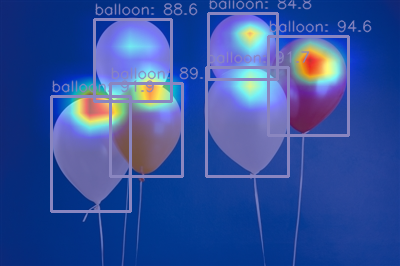

In [15]:
Image.open('output/balloon_test.png')     

**(b) 查看 neck 输出的最大输出特征图的 Grad CAM**

In [18]:
!python demo/boxam_vis_demo.py \
      ../mmdetection/balloon_dataset/balloon_test.png \
      ../mmdetection/balloon_dataset/balloon_rtmdet.py \
      ../mmdetection/work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth  \
      --target-layer neck.out_convs[0]  

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/balloon_rtmdet/best_coco/bbox_mAP_epoch_180.pth
[                                                  ] 0/1, elapsed: 0s, ETA:/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/miniconda3/lib/python3.8/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 6.4 task/s, elapsed: 0s, ETA:     0sAll done!
Results have been saved at /root/code/mmyolo/ou

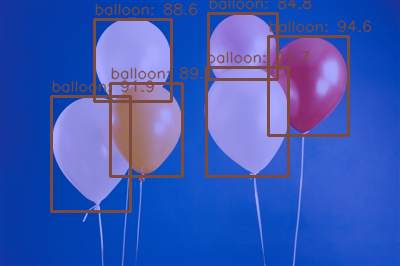

In [19]:
Image.open('output/balloon_test.png')     